This notebook generates a P-matrix at a single time stamp and at a single frequency for illustrative purpose in the midterm report. This should be extended to (at least) multiple channles for P-matrix construction in the final report.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
from pyuvdata import UVData, UVBeam
from pyuvdata import utils as uvutils
import healpy as hp
import h5py
import copy
from astropy import constants
import re
from astropy.cosmology import Planck18 as cosmo
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
from pathlib import Path
from torch import optim
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm
import logging
import pandas as pd
import wandb

from unet.unet_parts import *
from utils.data_loading import BasicDataset, CarvanaDataset
from utils.dice_score import dice_loss
from evaluate import evaluate
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

plt.rc('font', family='serif', size=18)

In [2]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=False):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = (DoubleConv(n_channels, 16))
        self.down1 = (Down(16, 32))
        self.down2 = (Down(32, 64))
        self.down3 = (Down(64, 128))
        factor = 2 if bilinear else 1
        self.down4 = (Down(128, 256 // factor))
        self.up1 = (Up(256, 128 // factor, bilinear))
        self.up2 = (Up(128, 64 // factor, bilinear))
        self.up3 = (Up(64, 32 // factor, bilinear))
        self.up4 = (Up(32, 16, bilinear))
        self.outc = (OutConv(16, n_classes))

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

    def use_checkpointing(self):
        self.inc = torch.utils.checkpoint(self.inc)
        self.down1 = torch.utils.checkpoint(self.down1)
        self.down2 = torch.utils.checkpoint(self.down2)
        self.down3 = torch.utils.checkpoint(self.down3)
        self.down4 = torch.utils.checkpoint(self.down4)
        self.up1 = torch.utils.checkpoint(self.up1)
        self.up2 = torch.utils.checkpoint(self.up2)
        self.up3 = torch.utils.checkpoint(self.up3)
        self.up4 = torch.utils.checkpoint(self.up4)
        self.outc = torch.utils.checkpoint(self.outc)

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}\t" + (f"{torch.cuda.get_device_name(0)}" if torch.cuda.is_available() else "CPU"))
logging.info(f'Using device {device}')

Using device: cuda	NVIDIA A100 80GB PCIe


In [4]:
torch.cuda.set_device(0)

In [5]:
print(torch.cuda.current_device())

0


In [6]:
dir_img = Path("/orcd/data/jhewitt/001/hgkim/Unet_bubble/hera_resolution_n64_downsample/image_cube_XYslice/subset1")
dir_mask = Path("/orcd/data/jhewitt/001/hgkim/Unet_bubble/sim_resolution_n64_downsample/mask_cube_v3_XYslice/subset1")
dir_checkpoint = Path("/orcd/data/jhewitt/001/hgkim/Unet_bubble/hera_resolution/checkpoint")

In [7]:
# 1. Create dataset
img_scale = 1
dataset = BasicDataset(dir_img, dir_mask, img_scale, mask_suffix='_mask')

In [8]:
dataset.mask_values

[0, 1]

In [9]:
epochs = 5
batch_size = 512
learning_rate = 1e-5
val_percent = 0.1
save_checkpoint = True
bilinear = True
amp = False
weight_decay = 1e-8
momentum = 0.999
gradient_clipping = 1.0

In [10]:
# 2. Split into train / validation partitions
n_val = int(len(dataset) * val_percent)
n_train = len(dataset) - n_val
train_set, val_set = random_split(dataset, [n_train, n_val], generator=torch.Generator().manual_seed(0))

In [11]:
# 3. Create data loaders
loader_args = dict(batch_size=batch_size, num_workers=os.cpu_count(), pin_memory=True)
train_loader = DataLoader(train_set, shuffle=True, **loader_args)
val_loader = DataLoader(val_set, shuffle=False, drop_last=True, **loader_args)

In [12]:
# # (Initialize logging)
# os.environ['WANDB_NOTEBOOK_NAME'] = "/home/hgkim/simulations/Unet/bubble_Unet_training_hera_resolution_test"
# experiment = wandb.init(project='U-Net', resume='allow', anonymous='must')
# experiment.config.update(
#     dict(epochs=epochs, batch_size=batch_size, learning_rate=learning_rate,
#          val_percent=val_percent, save_checkpoint=save_checkpoint, img_scale=img_scale, amp=amp)
# )

# logging.info(f'''Starting training:
#     Epochs:          {epochs}
#     Batch size:      {batch_size}
#     Learning rate:   {learning_rate}
#     Training size:   {n_train}
#     Validation size: {n_val}
#     Checkpoints:     {save_checkpoint}
#     Device:          {device.type}
#     Images scaling:  {img_scale}
#     Mixed Precision: {amp}
# ''')

In [13]:
# 4. Set up the optimizer, the loss, the learning rate scheduler and the loss scaling for AMP
model = UNet(n_channels=1, n_classes=1, bilinear=bilinear)
model = model.to()
model.to(device=device)
optimizer = optim.RMSprop(model.parameters(),
                          lr=learning_rate, weight_decay=weight_decay, momentum=momentum, foreach=True)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=5)  # goal: maximize Dice score
grad_scaler = torch.cuda.amp.GradScaler(enabled=amp)
criterion = nn.CrossEntropyLoss() if model.n_classes > 1 else nn.BCEWithLogitsLoss()
# criterion = nn.BCEWithLogitsLoss()
# model_p = nn.DataParallel(model, device_ids = [0,1])
global_step = 0

In [14]:
# 5. Begin training
for epoch in range(1, epochs + 1):
    model.train()
    epoch_loss = 0
    with tqdm(total=n_train, desc=f'Epoch {epoch}/{epochs}', unit='img') as pbar:
        for batch in train_loader:
            images, true_masks = batch['image'], batch['mask']

            assert images.shape[1] == model.n_channels, \
                f'Network has been defined with {model.n_channels} input channels, ' \
                f'but loaded images have {images.shape[1]} channels. Please check that ' \
                'the images are loaded correctly.'

            images = images.to(device=device, dtype=torch.float32, memory_format=torch.channels_last)
            true_masks = true_masks.to(device=device, dtype=torch.long)

            with torch.autocast(device.type if device.type != 'mps' else 'cpu', enabled=amp):
                masks_pred = model(images)
                if model.n_classes == 1:
                    loss = criterion(masks_pred.squeeze(1), true_masks.float())
                    loss += dice_loss(F.sigmoid(masks_pred.squeeze(1)), true_masks.float(), multiclass=False)
                else:
                    loss = criterion(masks_pred, true_masks)
                    loss += dice_loss(
                        F.softmax(masks_pred, dim=1).float(),
                        F.one_hot(true_masks, model.n_classes).permute(0, 3, 1, 2).float(),
                        multiclass=True
                    )

            optimizer.zero_grad(set_to_none=True)
            grad_scaler.scale(loss).backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), gradient_clipping)
            grad_scaler.step(optimizer)
            grad_scaler.update()

            pbar.update(images.shape[0])
            global_step += 1
            epoch_loss += loss.item()
#             experiment.log({
#                 'train loss': loss.item(),
#                 'step': global_step,
#                 'epoch': epoch
#             })
            pbar.set_postfix(**{'loss (batch)': loss.item()})

            # Evaluation round
            division_step = (n_train // (5 * batch_size))
            if division_step > 0:
                if global_step % division_step == 0:
#                     histograms = {}
#                     for tag, value in model.named_parameters():
#                         tag = tag.replace('/', '.')
#                         if not (torch.isinf(value) | torch.isnan(value)).any():
#                             histograms['Weights/' + tag] = wandb.Histogram(value.data.cpu())
#                         if not (torch.isinf(value.grad) | torch.isnan(value.grad)).any():
#                             histograms['Gradients/' + tag] = wandb.Histogram(value.grad.data.cpu())

                    val_score = evaluate(model, val_loader, device, amp)
                    scheduler.step(val_score)

                    logging.info('Validation Dice score: {}'.format(val_score))
                    try:
                        experiment.log({
                            'learning rate': optimizer.param_groups[0]['lr'],
                            'validation Dice': val_score,
                            'images': wandb.Image(images[0].cpu()),
                            'masks': {
                                'true': wandb.Image(true_masks[0].float().cpu()),
                                'pred': wandb.Image(masks_pred.argmax(dim=1)[0].float().cpu()),
                            },
                            'step': global_step,
                            'epoch': epoch,
                            **histograms
                        })
                    except:
                        pass

    if save_checkpoint:
        Path(dir_checkpoint).mkdir(parents=True, exist_ok=True)
        state_dict = model.state_dict()
        state_dict['mask_values'] = dataset.mask_values
        torch.save(state_dict, str(dir_checkpoint / 'checkpoint_epoch{}.pth'.format(epoch)))
        logging.info(f'Checkpoint {epoch} saved!')

Epoch 5/5: 100%|██████████| 9000/9000 [00:20<00:00, 446.49img/s, loss (batch)=0.55]


In [15]:
filepath = "/orcd/data/jhewitt/001/hgkim/Unet_bubble/hera_resolution/trained_model_mask_v3_CE_dice_loss_batch512_epoch5_n64_XYslice_subset1.pt"
torch.save(model, filepath)

In [54]:
filepath = "/orcd/data/jhewitt/001/hgkim/Unet_bubble/hera_resolution/trained_model_mask_v3_CE_dice_loss_batch512_epoch5_n64_XYslice_subset3.pt"
model = torch.load(filepath)
model.eval()

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     

In [16]:
total_params = sum(
    param.numel() for param in model.parameters()
)

In [17]:
total_params

1080641

In [31]:
file = "/orcd/data/jhewitt/001/hgkim/Unet_bubble/hera_resolution/image/subset_test2/model0732_fch012_015.npy"
data_ = np.load(file)
data_.shape

(112, 112)

In [8]:
img_scale=1
loader_args = dict(batch_size=batch_size, num_workers=os.cpu_count(), pin_memory=True)

In [18]:
dir_img_test = Path("/orcd/data/jhewitt/001/hgkim/Unet_bubble/hera_resolution_n64_downsample/image_cube_XYslice/subset_test")
dir_mask_test = Path("/orcd/data/jhewitt/001/hgkim/Unet_bubble/sim_resolution_n64_downsample/mask_cube_v3_XYslice/subset_test")
test_loader = BasicDataset(dir_img_test, dir_mask_test, img_scale, mask_suffix='_mask')

100%|██████████| 40000/40000 [00:40<00:00, 994.28it/s] 


In [19]:
# test_set = random_split(test_loader, [len(test_loader)], generator=torch.Generator().manual_seed(0))
test_loader = DataLoader(test_loader, shuffle=False, **loader_args)

In [49]:
for batch in test_loader:
    images, true_masks = batch['image'], batch['mask']

In [50]:
images = images.to(device=device, dtype=torch.float32, memory_format=torch.channels_last)
mask_pred = model(images)

In [51]:
mask_pred = (F.sigmoid(mask_pred) > 0.5).float()

In [39]:
mask_pred.shape

torch.Size([64, 1, 64, 64])

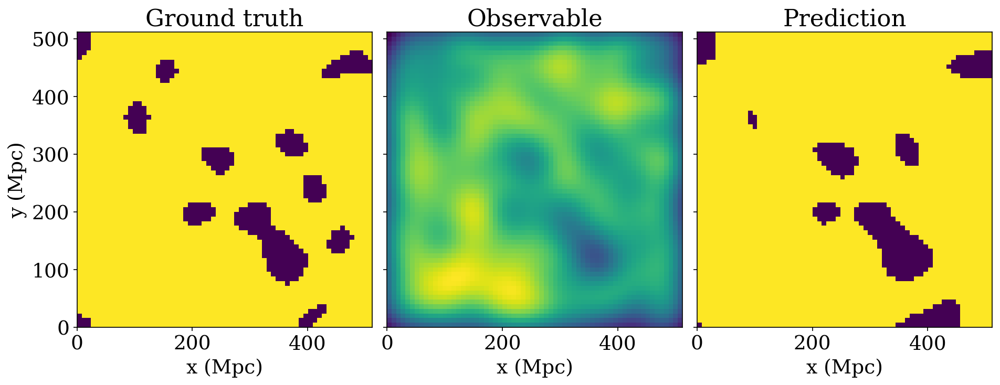

In [52]:
i = 20

fig = plt.figure(figsize=(15,5), dpi=150)
ax = fig.add_subplot(1,3,1)
ax.imshow(true_masks[i], extent=[0, 512, 0, 512])
ax.set_title('Ground truth')
ax.set_xlabel('x (Mpc)')
ax.set_ylabel('y (Mpc)')

image_ = images.squeeze(1)[i].cpu().detach().numpy()
ax = fig.add_subplot(1,3,2)
ax.imshow(image_, extent=[0, 512, 0, 512])
ax.set_title('Observable')
ax.set_xlabel('x (Mpc)')
ax.set_yticklabels([])

mask_pred_ = mask_pred.squeeze(1)[i].cpu().detach().numpy()
ax = fig.add_subplot(1,3,3)
ax.imshow(mask_pred_, extent=[0, 512, 0, 512])
ax.set_title('Prediction')
ax.set_xlabel('x (Mpc)')
ax.set_yticklabels([])

plt.subplots_adjust(wspace=0.05)
# plt.savefig('prediction_unsmooth_ground_truth.pdf', bbox_inches='tight')

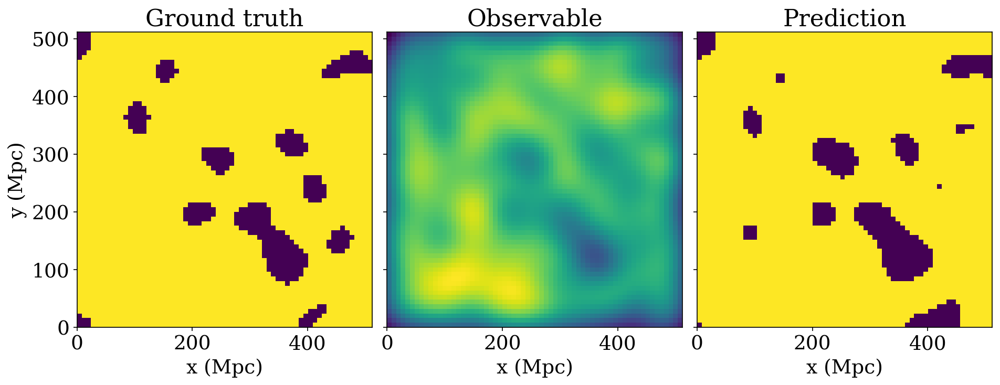

In [40]:
i = 20

fig = plt.figure(figsize=(15,5), dpi=150)
ax = fig.add_subplot(1,3,1)
ax.imshow(true_masks[i], extent=[0, 512, 0, 512])
ax.set_title('Ground truth')
ax.set_xlabel('x (Mpc)')
ax.set_ylabel('y (Mpc)')

image_ = images.squeeze(1)[i].cpu().detach().numpy()
ax = fig.add_subplot(1,3,2)
ax.imshow(image_, extent=[0, 512, 0, 512])
ax.set_title('Observable')
ax.set_xlabel('x (Mpc)')
ax.set_yticklabels([])

mask_pred_ = mask_pred.squeeze(1)[i].cpu().detach().numpy()
ax = fig.add_subplot(1,3,3)
ax.imshow(mask_pred_, extent=[0, 512, 0, 512])
ax.set_title('Prediction')
ax.set_xlabel('x (Mpc)')
ax.set_yticklabels([])

plt.subplots_adjust(wspace=0.05)
# plt.savefig('prediction_unsmooth_ground_truth.pdf', bbox_inches='tight')

In [56]:
img_scale = 1
loader_args = dict(batch_size=batch_size, num_workers=os.cpu_count(), pin_memory=True)
dir_img_test = Path("/orcd/data/jhewitt/001/hgkim/Unet_bubble/hera_resolution/image/subset_test")
dir_mask_test = Path("/orcd/data/jhewitt/001/hgkim/Unet_bubble/hera_resolution/mask_v3/subset_test")
test_loader = BasicDataset(dir_img_test, dir_mask_test, img_scale, mask_suffix='_mask')

# test_set = random_split(test_loader, [len(test_loader)], generator=torch.Generator().manual_seed(0))
test_loader = DataLoader(test_loader, shuffle=False, **loader_args)

for batch in test_loader:
    images, true_masks = batch['image'], batch['mask']
    
images = images.to(device=device, dtype=torch.float32, memory_format=torch.channels_last)
mask_pred = model(images)

mask_pred = (F.sigmoid(mask_pred) > 0.5).float()

100%|██████████| 2000/2000 [00:00<00:00, 4387.45it/s]


In [27]:
x = np.linspace(0, 512, true_masks[0].shape[0])
y = np.linspace(0, 512, true_masks[0].shape[1])
xx, yy = np.meshgrid(x, y, indexing='ij')

In [28]:
images.shape

torch.Size([464, 1, 112, 112])

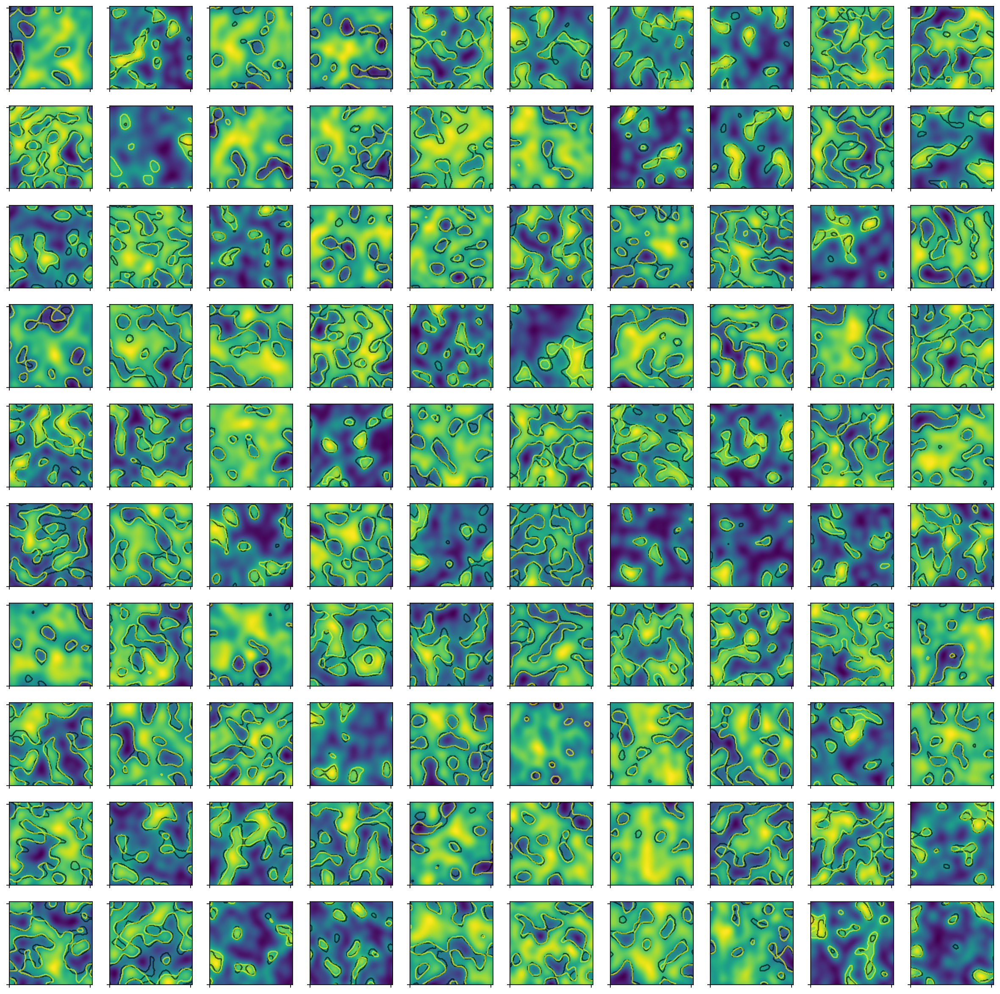

In [58]:
fig = plt.figure(figsize=(20,20), dpi=150)
for i in range(100):
    ax = fig.add_subplot(10,10,i+1)
    image_ = images.squeeze(1)[i].cpu().detach().numpy()
    ax.imshow(image_, extent=[0, 512, 0, 512])
    ax.contour(xx, yy, true_masks[i].cpu().detach().numpy()[::-1].T, levels=[0.5], colors=['black'], alpha=0.6)
    ax.contour(xx, yy, mask_pred.squeeze(1)[i].cpu().detach().numpy()[::-1].T, levels=[0.5], colors=['yellow'], alpha=0.6)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    # ax.set_xlabel('x (Mpc)')
    # ax.set_ylabel('y (Mpc)')

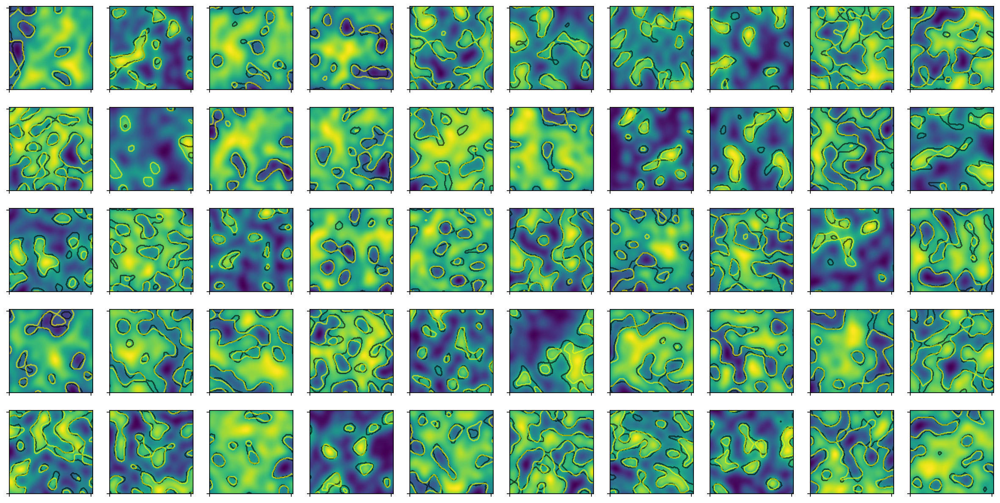

In [63]:
fig = plt.figure(figsize=(20,10), dpi=150)
for i in range(50):
    ax = fig.add_subplot(5,10,i+1)
    image_ = images.squeeze(1)[i].cpu().detach().numpy()
    ax.imshow(image_, extent=[0, 512, 0, 512])
    ax.contour(xx, yy, true_masks[i].cpu().detach().numpy()[::-1].T, levels=[0.5], colors=['black'], alpha=0.6)
    ax.contour(xx, yy, mask_pred.squeeze(1)[i].cpu().detach().numpy()[::-1].T, levels=[0.5], colors=['yellow'], alpha=0.6)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    # ax.set_xlabel('x (Mpc)')
    # ax.set_ylabel('y (Mpc)')

In [30]:
def evaluate_model(model, dataloader, device):
    model.eval()
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for batch in dataloader:
            images, targets = batch['image'], batch['mask']

            # Transfer data to the GPU if available
            images, targets = images.to(device), targets.to(device)

            # Forward pass
            outputs = model(images)

            # Assuming a binary segmentation task
            predictions = (outputs > 0.5).float()

            # Collect predictions and targets for evaluation
            all_predictions.append(predictions.cpu().detach().numpy())
            all_targets.append(targets.cpu().detach().numpy())

#     all_predictions = np.array(all_predictions)
#     print(all_predictions.shape)
    all_predictions = torch.from_numpy(np.concatenate(all_predictions, axis=0))
    all_targets = torch.from_numpy(np.concatenate(all_targets, axis=0))

    return all_predictions, all_targets

In [31]:
predictions, targets = evaluate_model(model, test_loader, device)

# Flatten predictions and targets for computing metrics
flat_predictions = predictions.view(-1).numpy()
flat_targets = targets.view(-1).numpy()

# Binary classification metrics
accuracy = accuracy_score(flat_targets, flat_predictions)
precision = precision_score(flat_targets, flat_predictions)
recall = recall_score(flat_targets, flat_predictions)
f1 = f1_score(flat_targets, flat_predictions)

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')

Accuracy: 0.9142
Precision: 0.9402
Recall: 0.8908


In [ ]:
plt.figure()